This notebook prepares the [Grocery Dataset](https://github.com/gulvarol/grocerydataset) to train an object detection model to detect products from a store shelf image.

In [1]:
!pip install tensorboardX

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.6/101.6 kB 8.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 304.5/304.5 kB 23.6 MB/s eta 0:00:00
  Attempting uninstall: protobuf
    Found existing installation: protobuf 3.20.3
    Uninstalling protobuf-3.20.3:
      Successfully uninstalled protobuf-3.20.3


## Gather data sources

Download part1 dataset

In [ ]:
!wget -q https://storage.googleapis.com/open_source_datasets/ShelfImages.tar.gz
!tar xf ShelfImages.tar.gz

Download part2 dataset

In [ ]:
!wget -q https://github.com/gulvarol/grocerydataset/releases/download/1.0/GroceryDataset_part2.tar.gz
!tar xf GroceryDataset_part2.tar.gz

In [ ]:
!ls -lh ShelfImages | head -10
!ls -lh ShelfImages/train | head -10
!ls -lh ShelfImages/test | head -10

total 20K
drwxrwxr-x 2 1001 1001 4.0K Oct  2 21:08 test
drwxrwxr-x 2 1001 1001  16K Oct  2 21:08 train
total 456M
-rw-r--r-- 1 1001 1001  645K Oct 23  2019 C1_P01_N1_S2_1.JPG
-rw-r--r-- 1 1001 1001  2.1M Oct 23  2019 C1_P01_N1_S2_2.JPG
-rw-r--r-- 1 1001 1001  1.1M Oct 23  2019 C1_P01_N1_S3_1.JPG
-rw-r--r-- 1 1001 1001  870K Oct 23  2019 C1_P01_N1_S3_2.JPG
-rw-r--r-- 1 1001 1001  907K Oct 23  2019 C1_P01_N1_S5_1.JPG
-rw-r--r-- 1 1001 1001  2.1M Oct 23  2019 C1_P01_N2_S2_1.JPG
-rw-r--r-- 1 1001 1001  1.3M Oct 23  2019 C1_P01_N2_S3_1.JPG
-rw-r--r-- 1 1001 1001  1.1M Oct 23  2019 C1_P01_N2_S4_1.JPG
-rw-r--r-- 1 1001 1001  2.0M Oct 23  2019 C1_P01_N3_S2_1.JPG
total 101M
-rw-r--r-- 1 1001 1001 1.6M Oct 23  2019 C1_P02_N1_S5_1.JPG
-rw-r--r-- 1 1001 1001 2.3M Oct 23  2019 C1_P02_N2_S2_1.JPG
-rw-r--r-- 1 1001 1001 2.3M Oct 23  2019 C1_P02_N2_S3_1.JPG
-rw-r--r-- 1 1001 1001 1.3M Oct 23  2019 C1_P03_N1_S2_1.JPG
-rw-r--r-- 1 1001 1001 1.6M Oct 23  2019 C1_P03_N1_S3_1.JPG
-rw-r--r-- 1 1001 1001 2.4

From [here](https://github.com/gulvarol/grocerydataset#shelfimages) we can get a sense of how an individual image is named:

```
"C<c>_P<p>_N<n>_S<s>_<i>.JPG"
    where
        <c> := camera id (1: iPhone5S, 2: iPhone4, 3: Sony Cybershot, 4: Nikon Coolpix)
        <p> := planogram id
        <n> := the rank of the top shelf on the image according to the planogram
        <s> := number of shelves on the image
        <i> := copy number
```

## Imports

In [ ]:
from imutils import paths
from typing import List
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import os
from tqdm import tqdm
import torch

print('Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Using torch 1.9.0+cu102 _CudaDeviceProperties(name='Tesla K80', major=3, minor=7, total_memory=11441MB, multi_processor_count=13)


## Visualize the raw images

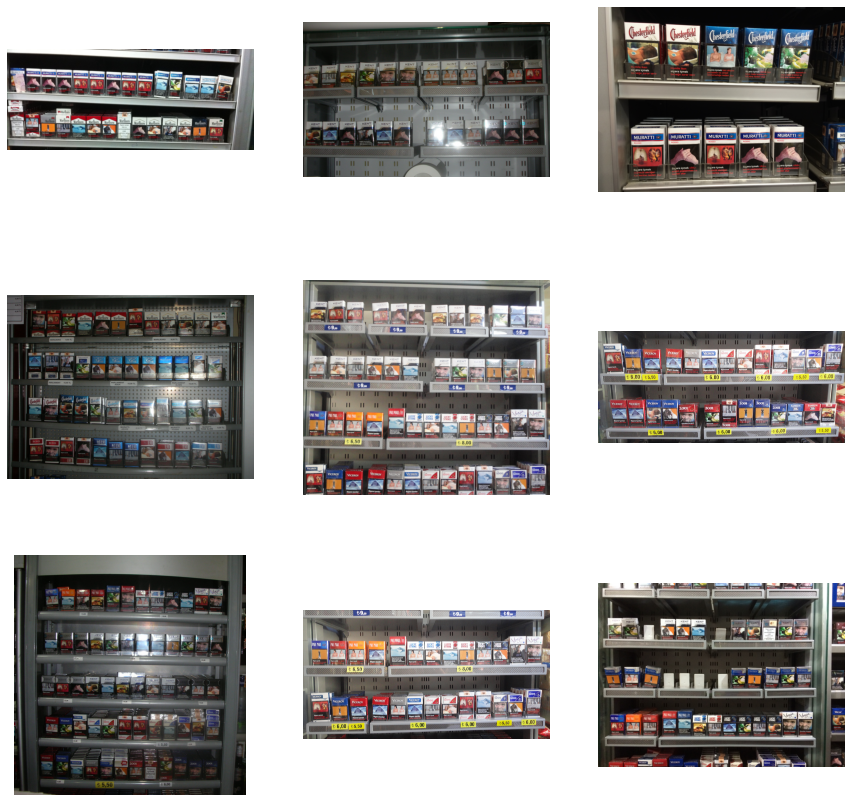

In [ ]:
train_images = list(paths.list_images("ShelfImages/train"))
plt.figure(figsize=(15, 15))
for i, image  in enumerate(train_images[:9]):
    image = plt.imread(image)
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(image)
    plt.axis("off")

A question that gets raised here - how do I map these images to their detection annotations? From [here](https://github.com/gulvarol/grocerydataset#annotationtxt) we have the following information (which is summarized in [`annotations.csv`](https://github.com/gulvarol/grocerydataset/blob/master/annotations.csv)) -

```
<shelf image name> <n> <x_1> <y_1> <w_1> <h_1> <b_1> <x_2> <y_2> <w_2> <h_2> <b_2> ... <x_n> <y_n> <w_n> <h_n> <b_n>
    where
        <shelf image name>   := shelf image name
        <n>                  := number of product on the shelf image
        <x_i>                := x1-coordinate of the i'th product image
        <y_i>                := y1-coordinate of the i'th product image
        <w_i>                := x2 of the i'th product image
        <h_i>                := y2 of the i'th product image
        <b_i>                := brand of the i'th product image

width = x2 - x1
height = y2 - y1
```

## Visualize bbox annotations

In [ ]:
cols = ["image_name", "x_i", "y_i", "w_i", "h_i", "b_i"]
master_df = pd.read_csv("https://raw.githubusercontent.com/gulvarol/grocerydataset/master/annotations.csv",
                        names=cols)
master_df.head()

,image_name,x_i,y_i,w_i,h_i,b_i
0,C1_P01_N1_S2_1.JPG,1008,1552,1260,1928,0
1,C1_P01_N1_S2_1.JPG,1028,928,1280,1304,0
2,C1_P01_N1_S2_1.JPG,24,872,268,1264,0
3,C1_P01_N1_S2_1.JPG,280,1568,532,1944,0
4,C1_P01_N1_S2_1.JPG,292,872,544,1248,0


In [ ]:
master_df

,image_name,x_i,y_i,w_i,h_i,b_i
0,C1_P01_N1_S2_1.JPG,1008,1552,1260,1928,0
1,C1_P01_N1_S2_1.JPG,1028,928,1280,1304,0
2,C1_P01_N1_S2_1.JPG,24,872,268,1264,0
3,C1_P01_N1_S2_1.JPG,280,1568,532,1944,0
4,C1_P01_N1_S2_1.JPG,292,872,544,1248,0
...,...,...,...,...,...,...
13179,C4_P08_N3_S3_2.JPG,1456,416,1688,736,2
13180,C4_P08_N3_S3_2.JPG,1684,420,1916,740,2
13181,C4_P08_N3_S3_2.JPG,1904,424,2136,744,2
13182,C4_P08_N3_S3_2.JPG,1432,1636,1664,1972,9


In [ ]:
# How many unique brands? (0 stands for "other" class)
master_df["b_i"].unique()

array([ 0,  1,  4,  7,  3,  6, 10,  2,  5,  8,  9])

Let's visualize a few images with their respective annotations. We will write a small utility for this purpose.

In [ ]:
def vis_annotations(image_path: str, coordinate_list: List[List[int]],
                    color: str="blue") -> None:
    """Converts bounding box to matplotlib format, imposes it on the
    provided image and then displays the plot."""
    image = plt.imread(image_path)
    fig = plt.imshow(image)
    for i in range(len(coordinate_list)):
        bbox = coordinate_list[i]
        fig.axes.add_patch(plt.Rectangle(
            xy=(bbox[0], bbox[1]), width=bbox[2]-bbox[0], height=bbox[3]-bbox[1],
            fill=False, edgecolor=color, linewidth=2))
    plt.show()

Let's start with the first image from the dataframe above. Its absolute path is present in `train_images`.

In [ ]:
train_images[0]

'ShelfImages/train/C2_P04_N2_S2_1.JPG'

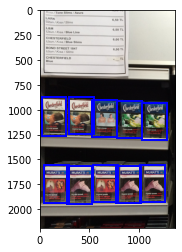

In [ ]:
coordinate_columns = master_df.columns[1:-1]
coordinate_list = master_df[master_df["image_name"]=="C1_P01_N1_S2_1.JPG"][coordinate_columns]
coordinate_list = coordinate_list.values.tolist()
vis_annotations("ShelfImages/train/C1_P01_N1_S2_1.JPG", coordinate_list)

## Splitting into train and test dataframes

We already have the train and test images segregated. We can use that information to split `master_df` into train and test dataframes.

In [ ]:
# Grab the image names belonging to the train and test sets
train_images = list(paths.list_images("ShelfImages/train"))
test_images = list(paths.list_images("ShelfImages/test"))
train_image_names = [image_path.split("/")[-1] for image_path in train_images]
test_image_names = [image_path.split("/")[-1] for image_path in test_images]
print(len(train_image_names), len(test_image_names))

283 71


In [ ]:
# Create two different dataframes from train and test sets
train_df = master_df[master_df["image_name"].isin(train_image_names)]
test_df = master_df[~master_df["image_name"].isin(train_image_names)]
print(len(np.unique(train_df["image_name"])), len(np.unique(test_df["image_name"])))

283 71


In [ ]:
# Let's turn the image names into absolute paths
train_df["image_name"] = train_df["image_name"].map(lambda x: "ShelfImages/train/" + x)
test_df["image_name"] = test_df["image_name"].map(lambda x: "ShelfImages/test/" + x)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [ ]:
# Preview
train_counts = len(train_df['image_name'].unique())
test_counts = len(test_df['image_name'].unique())
print(f'Total Unique train images {train_counts}')
print(f'Total Unique test images {test_counts}')

Total Unique train images 283
Total Unique test images 71


## **Data Preperation**

In [ ]:
# it takes class label, xy, wh
def form_line(cls, x, y, w, h):
  line = str(cls)+' '+ str(x) +' '+ str(y) + ' ' + str(w) + ' ' + str(h) + '\n'
  return line

**Note: plt.imread().shape returns height*width**
This is the reason we use np.flip

In [ ]:
train_df['b_i'].unique()

array([ 0,  1,  4,  7,  3,  6, 10,  2,  5,  8,  9])

**Define functions to prepare the image and annotation(.txt) pairs for object detection**

In [ ]:
# fetch list of train images in the shelf images dataset
train_images = sorted(train_df['image_name'].unique())
# fetch list of test images in the shelf images dataset
test_images = sorted(test_df['image_name'].unique())

# destination train image path
dst_train_path = os.path.join('/content/Prep_data/train', 'images')
# destination test image path
dst_test_path = os.path.join('/content/Prep_data/test', 'images')
# train annotation path
annot_train = os.path.join('/content/Prep_data/train', 'labels')
# test annotation path
annot_test = os.path.join('/content/Prep_data/test', 'labels')

# prepare destination directory
if not os.path.isdir('/content/Prep_data'):
  os.mkdir('/content/Prep_data')
  # train and test path
  os.mkdir('/content/Prep_data/train')
  os.mkdir('/content/Prep_data/test')

def fetch_annotation(img_path, df):
  img_id = img_path.split('/')[-1]
  img_w, img_h = np.flip(plt.imread(img_path).shape[:2])[:2]
  lines = ''
  for record in np.array(df[df['image_name']==img_path]):
    #print(f'Image name {img_id}')
    class_label = record[-1]
    w = record[3] - record[1]
    h = record[4] - record[2]
    c_x = record[1] + (w/2)
    c_y = record[2] + (h/2)
    x_norm = c_x/(img_w)
    y_norm = c_y/(img_h)
    w_norm = w/img_w
    h_norm = h/img_h
    lines+= form_line(class_label, x_norm, y_norm, w_norm, h_norm)
  return img_id, lines

# create annotation files
def data_prep(annot_path, dst_img_path, img_paths, df):
  # if annotation folder not exists
  if not os.path.isdir(annot_path):
    os.mkdir(annot_path)
  # if seperate image folder not exists
  if not os.path.isdir(dst_img_path):
    os.mkdir(dst_img_path)

  for img_path in tqdm(img_paths):
    img = plt.imread(img_path)
    img_id, lines = fetch_annotation(img_path, df)
    plt.imsave(os.path.join(dst_img_path, img_id), img)

    img_name = img_id.split('.')[0]
    annot_img_file = os.path.join(annot_path, img_name)+'.txt'
    if not os.path.isfile(annot_img_file):
      with open(annot_img_file, 'x') as f:
        f.write(lines)

  assert len(os.listdir(annot_path)) == len(os.listdir(dst_img_path))
  print('\nCheck passed!')

Prepare train set

In [ ]:
# data_prep(annot_train, dst_train_path, train_images, train_df)

100%|██████████| 283/283 [02:25<00:00,  1.94it/s]


Check passed!


Prepare test set

In [ ]:
# data_prep(annot_test, dst_test_path, test_images, test_df)

100%|██████████| 71/71 [00:35<00:00,  1.98it/s]


Check passed!


In [ ]:
# mount drive
from google.colab import drive

drive.mount('/content/drive/')

Mounted at /content/drive/


In [ ]:
%cd /content
!pwd

/content
/content


In [2]:
# clone Scaled_YOLOv4
!git clone https://github.com/roboflow-ai/ScaledYOLOv4.git /content/drive/MyDrive/yolov4 # clone repo
%cd /content/drive/MyDrive/yolov4
#checkout the yolov4-large branch
!git checkout yolov4-large

Cloning into '/content/drive/MyDrive/yolov4'...
remote: Enumerating objects: 133, done.
remote: Counting objects: 100% (5/5), done.
remote: Compressing objects: 100% (5/5), done.
remote: Total 133 (delta 0), reused 0 (delta 0), pack-reused 128
Receiving objects: 100% (133/133), 408.74 KiB | 16.35 MiB/s, done.
Resolving deltas: 100% (39/39), done.
/content/drive/MyDrive/yolov4
Branch 'yolov4-large' set up to track remote branch 'yolov4-large' from 'origin'.
Switched to a new branch 'yolov4-large'


In [3]:
#install mish activation funciton for cuda
%cd /content/
!git clone https://github.com/JunnYu/mish-cuda
%cd mish-cuda
!python setup.py build install

/content
Cloning into 'mish-cuda'...
remote: Enumerating objects: 195, done.
remote: Counting objects: 100% (88/88), done.
remote: Compressing objects: 100% (75/75), done.
remote: Total 195 (delta 7), reused 79 (delta 3), pack-reused 107
Receiving objects: 100% (195/195), 208.77 KiB | 10.44 MiB/s, done.
Resolving deltas: 100% (56/56), done.
/content/mish-cuda
/usr/local/lib/python3.10/dist-packages/setuptools/_distutils/extension.py:134: UserWarning: Unknown Extension options: 'headers'
  warnings.warn(msg)
running build
running build_py
creating build
creating build/lib.linux-x86_64-cpython-310
creating build/lib.linux-x86_64-cpython-310/mish_cuda
copying src/mish_cuda/__init__.py -> build/lib.linux-x86_64-cpython-310/mish_cuda
running egg_info
creating src/mish_cuda.egg-info
writing src/mish_cuda.egg-info/PKG-INFO
writing dependency_links to src/mish_cuda.egg-info/dependency_links.txt
writing requirements to src/mish_cuda.egg-info/requires.txt
writing top-level names to src/mish_cuda

In [4]:
# install pyYaml
!pip install -U PyYAML

In [7]:
%cd /content/drive/MyDrive/yolov4/

/content/drive/MyDrive/yolov4


In [8]:
!pip install roboflow

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.4/57.4 kB 4.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 155.3/155.3 kB 13.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 6.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 8.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.6/55.6 kB 6.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 6.2 MB/s eta 0:00:00
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9657 sha256=f947a4b24654259a01c97efdd809bda36e059e617c0a22809184f6a0566aefbe
  Stored in directory: /root/.cache/pip/wheels/8b/f1/7f/5c94f0a7a505ca1c81cd1d9208ae2064675d97582078e6c769
Successfully built wget
  Attempting uninstall: pyparsing
    Found existing installation: pyparsing 3.1.0
    Uninstalling pyparsing-3.1.0:
      Successfully uninstalled pyparsing-3.1.0
  Attempting uninstall: idna
    Found e

In [9]:


from roboflow import Roboflow
rf = Roboflow(api_key="Add your API")
project = rf.workspace("project-6oaph").project("groceries_detection")
dataset = project.version(2).download("yolov4scaled")


loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to groceries_detection-2 in yolov4scaled:: 100%|██████████| 1712/1712 [00:00<00:00, 2127.88it/s]


In [10]:
%cd ..
# this is the YAML file Roboflow wrote for us that we're loading into this notebook with our data
%cat {dataset.location}/data.yaml

/content/drive/MyDrive
train: ../train/images
val: ../valid/images
test: ../test/images

nc: 11
names: ['0', '1', '10', '2', '3', '4', '5', '6', '7', '8', '9']

roboflow:
  workspace: project-6oaph
  project: groceries_detection
  version: 2
  license: CC BY 4.0
  url: https://universe.roboflow.com/project-6oaph/groceries_detection/dataset/2

In [11]:
%cat /content/drive/MyDrive/yolov4/models/yolov4-p5.yaml

# parameters
nc: 80  # number of classes
depth_multiple: 1.0  # model depth multiple
width_multiple: 1.0  # layer channel multiple

# anchors
anchors:
  - [13,17,  31,25,  24,51, 61,45]  # P3/8
  - [48,102,  119,96, 97,189, 217,184]  # P4/16
  - [171,384, 324,451, 616,618, 800,800]  # P5/32

# csp-p5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [32, 3, 1]],  # 0
   [-1, 1, Conv, [64, 3, 2]],  # 1-P1/2
   [-1, 1, BottleneckCSP, [64]],
   [-1, 1, Conv, [128, 3, 2]],  # 3-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 5-P3/8
   [-1, 15, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 7-P4/16
   [-1, 15, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]], # 9-P5/32
   [-1, 7, BottleneckCSP, [1024]],  # 10
  ]

# yolov4-p5 head
# na = len(anchors[0])
head:
  [[-1, 1, SPPCSP, [512]], # 11
   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [8, 1, Conv, [256, 1, 1]], # route backbone P4
   [[-1, -2], 1,

Current epoch starts from 111

In [12]:
orig_dataset_directory = dataset.location
orig_dataset_directory

'/content/drive/MyDrive/yolov4/groceries_detection-2'

In [13]:
%cd {orig_dataset_directory}
%cp -r {orig_dataset_directory} /content/yolov4

/content/drive/MyDrive/yolov4/groceries_detection-2


In [20]:
# train scaled-YOLOv4 on custom data for 100 epochs
# time its performance/

%%time
%cd /content/drive/MyDrive/yolov4
!python train.py --img 896 --batch 4 --epochs 20 --data '{dataset.location}/data.yaml' --cfg '/content/drive/MyDrive/yolov4/models/yolov4-p5.yaml' --weights '' --name yolov4-5p-results  --cache

/content/drive/MyDrive/yolov4
2023-07-14 07:12:07.715700: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-07-14 07:12:09.647510: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Using CUDA device0 _CudaDeviceProperties(name='Tesla T4', total_memory=15101MB)

Namespace(weights='', cfg='/content/drive/MyDrive/yolov4/models/yolov4-p5.yaml', data='/content/drive/MyDrive/yolov4/groceries_detection-2/data.yaml', hyp='data/hyp.scratch.yaml', epochs=20, batch_size=4, img_size=[896, 896], rect=False, resume=False, nosave=False, notest=False, noautoanchor=False, evolve=False, bucket='', cache_images=True, name='yolov4-5p-results', device='', multi_scale=False, single_cls=False, adam=False, sync_bn=False, 

## **Evaluate Custom Scaled-YOLOv4 Detector Performance**

Training losses and performance metrics are saved to Tensorboard and also to a logfile defined above with the **--name** flag when we train. In our case, we named this `yolov5s_results`. (If given no name, it defaults to `results.txt`.) The results file is plotted as a png after training completes.

Note from Glenn: Partially completed `results.txt` files can be plotted with `from utils.utils import plot_results; plot_results()`.

In [21]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 2593), started 1:49:39 ago. (Use '!kill 2593' to kill it.)

<IPython.core.display.Javascript object>

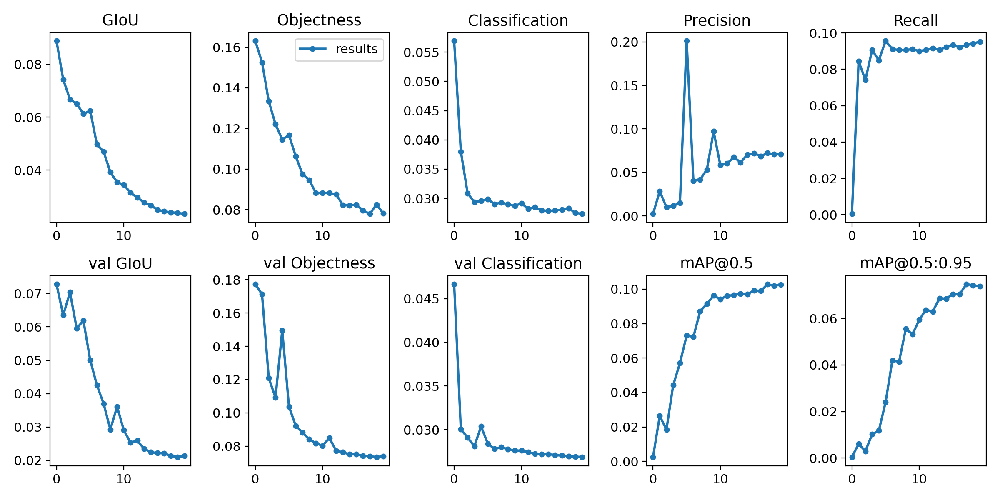

In [26]:
# we can also output some older school graphs if the tensor board isn't working for whatever reason...
#from utils.general import plot_results  # plot results.txt as results.png
from IPython.display import Image, display
display(Image('/content/drive/MyDrive/yolov4/runs/exp5_yolov4-5p-results/results.png'))  # view results.png

GROUND TRUTH TRAINING DATA:


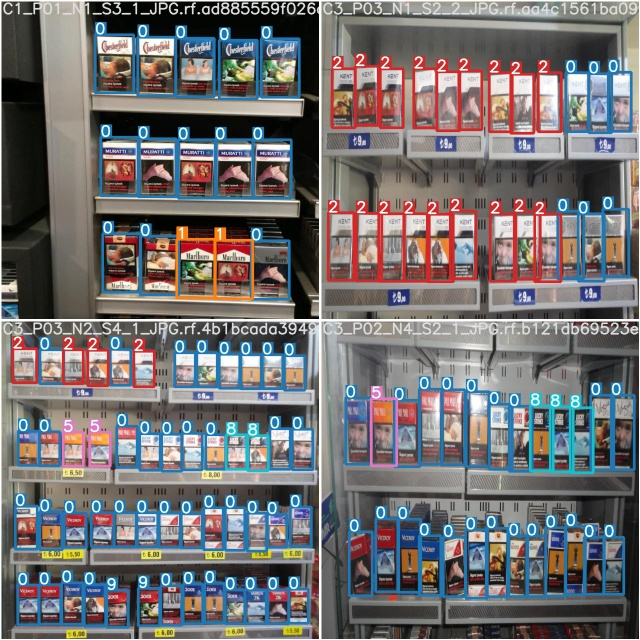

In [36]:
# first, display our ground truth data
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/drive/MyDrive/yolov4/runs/exp5_yolov4-5p-results/test_batch0_gt.jpg', width=900)

GROUND TRUTH AUGMENTED TRAINING DATA:


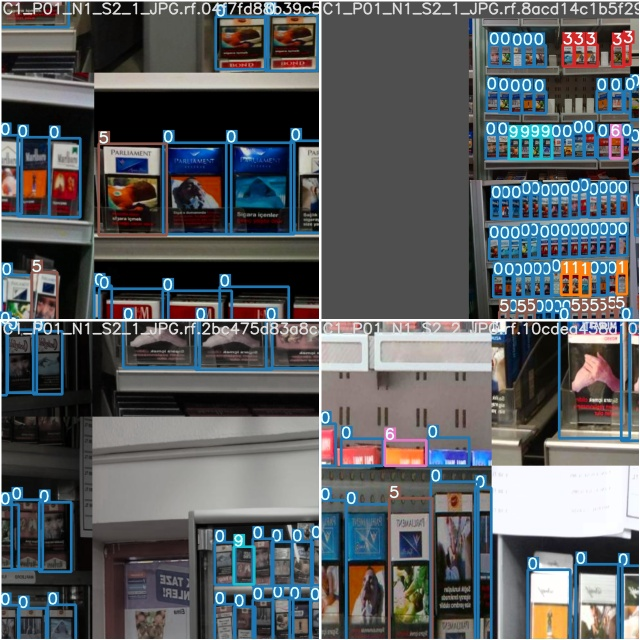

In [39]:
# print out an augmented training example
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='/content/drive/MyDrive/yolov4/runs/exp5_yolov4-5p-results/train_batch0.jpg', width=900)

In [40]:
# trained weights are saved by default in our weights folder
%ls runs/

exp0_yolov4-5p-results/  exp2_yolov4-5p-results/  exp4_yolov4-5p-results/
exp1_yolov4-5p-results/  exp3_yolov4-5p-results/  exp5_yolov4-5p-results/


In [41]:
%ls ./runs/exp5_yolov4-5p-results/weights

best_yolov4-5p-results.pt        last_006.pt  last_014.pt
best_yolov4-5p-results_strip.pt  last_007.pt  last_015.pt
last_000.pt                      last_008.pt  last_016.pt
last_001.pt                      last_009.pt  last_017.pt
last_002.pt                      last_010.pt  last_018.pt
last_003.pt                      last_011.pt  last_019.pt
last_004.pt                      last_012.pt  last_yolov4-5p-results.pt
last_005.pt                      last_013.pt  last_yolov4-5p-results_strip.pt


In [43]:
# when we ran this, we saw .007 second inference time. That is 140 FPS on a TESLA P100!
# use the best weights!
%cd /content/drive/MyDrive/yolov4/
TEST_DIR = f'{dataset.location}/test/images'
!python detect.py --weights ./runs/exp5_yolov4-5p-results/weights/best_yolov4-5p-results.pt --img 416 --conf 0.4 --source {TEST_DIR}

/content/drive/MyDrive/yolov4
Namespace(weights=['./runs/exp5_yolov4-5p-results/weights/best_yolov4-5p-results.pt'], source='/content/drive/MyDrive/yolov4/groceries_detection-2/test/images', output='inference/output', img_size=416, conf_thres=0.4, iou_thres=0.5, device='', view_img=False, save_txt=False, classes=None, agnostic_nms=False, augment=False, update=False)
Using CUDA device0 _CudaDeviceProperties(name='Tesla T4', total_memory=15101MB)

Fusing layers... Model Summary: 331 layers, 7.02988e+07 parameters, 6.81919e+07 gradients
/usr/local/lib/python3.10/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
image 1/35 /content/drive/MyDrive/yolov4/groceries_detection-2/test/images/C1_P01_N3_S3_1_JPG.rf.b908725343de0a7973a3257ff2f82d4b.jpg: 416x416 15 0s

/content/drive/MyDrive/yolov4


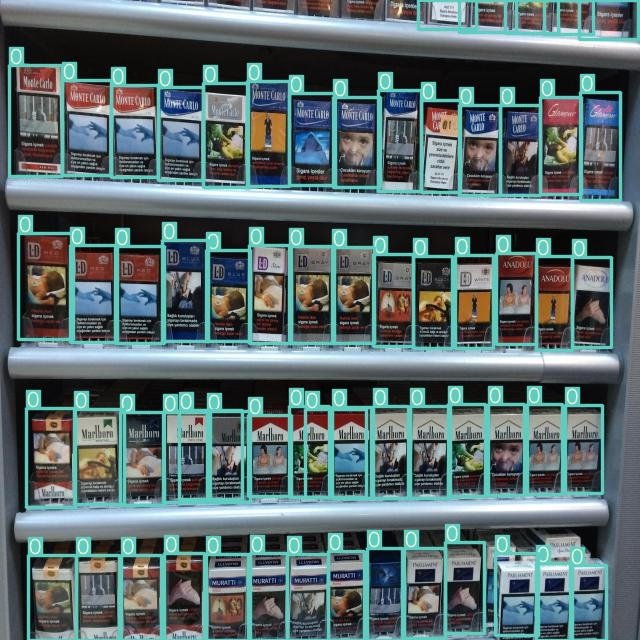

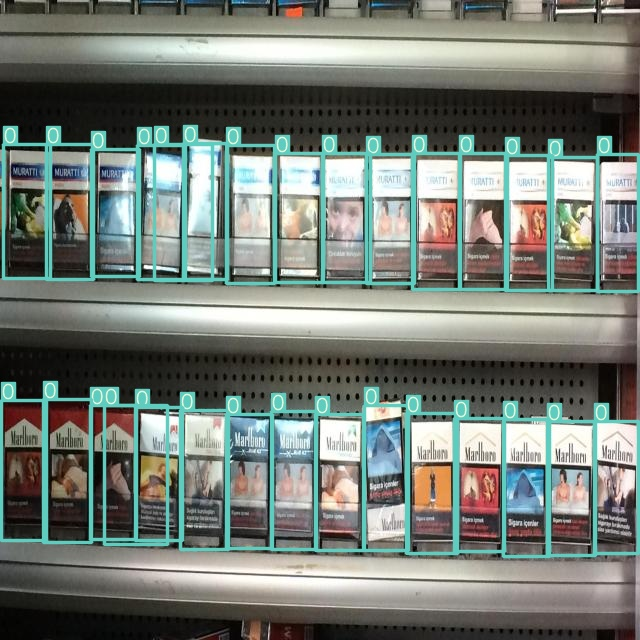

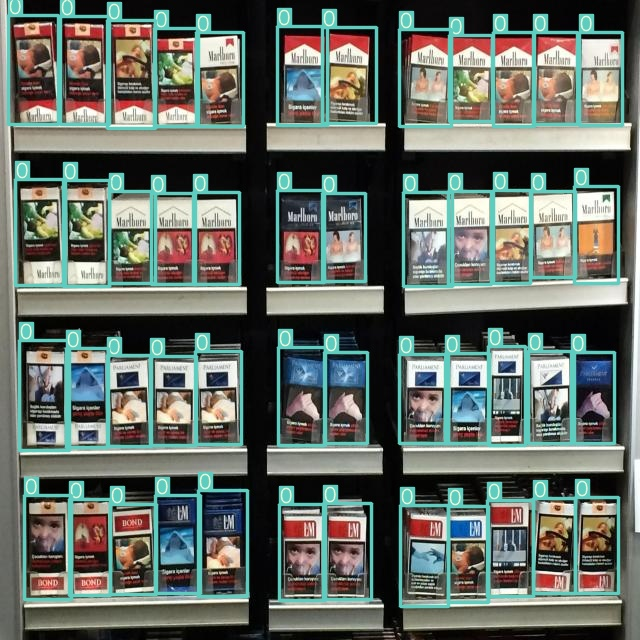

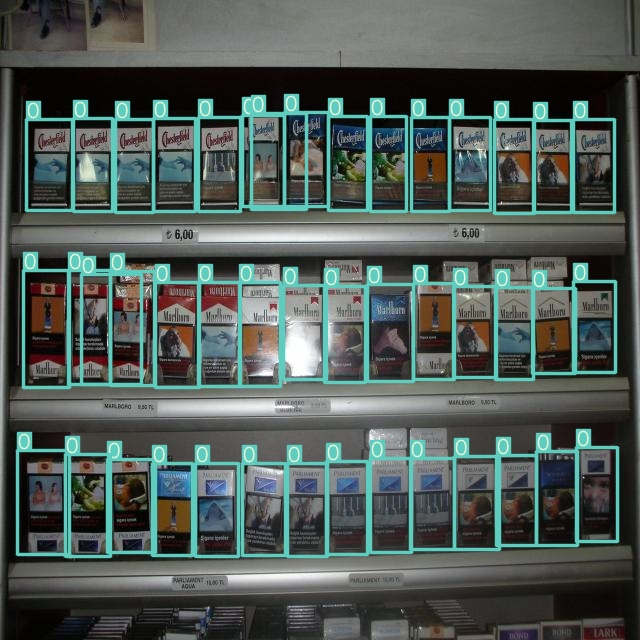

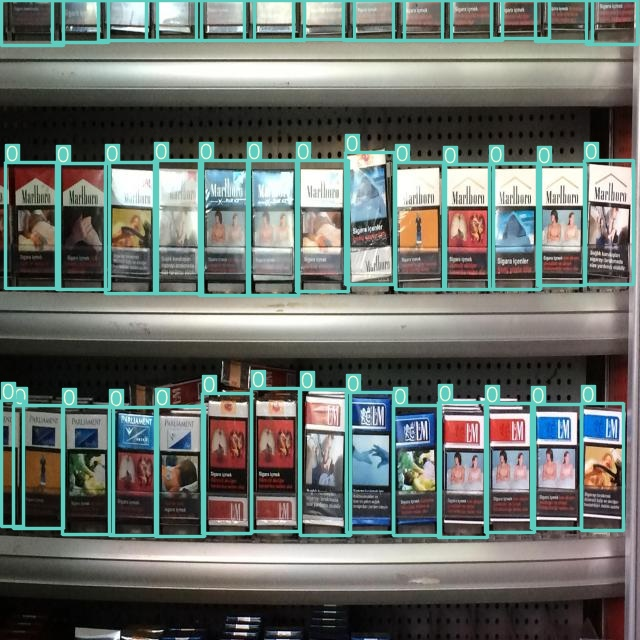

...

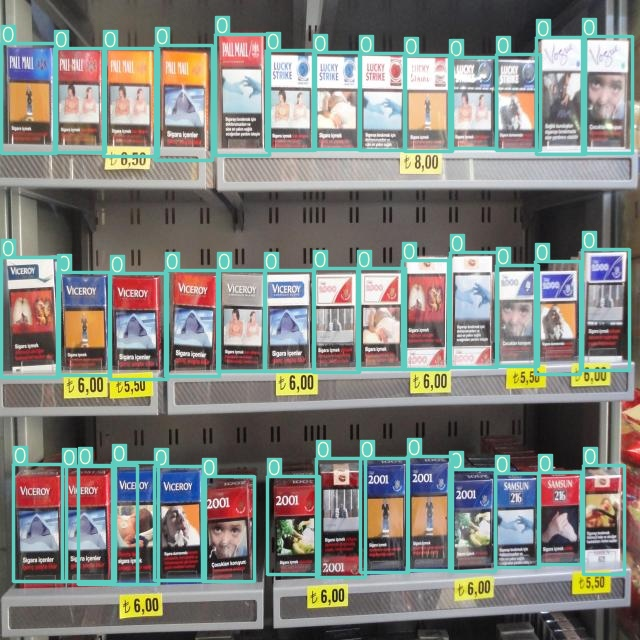

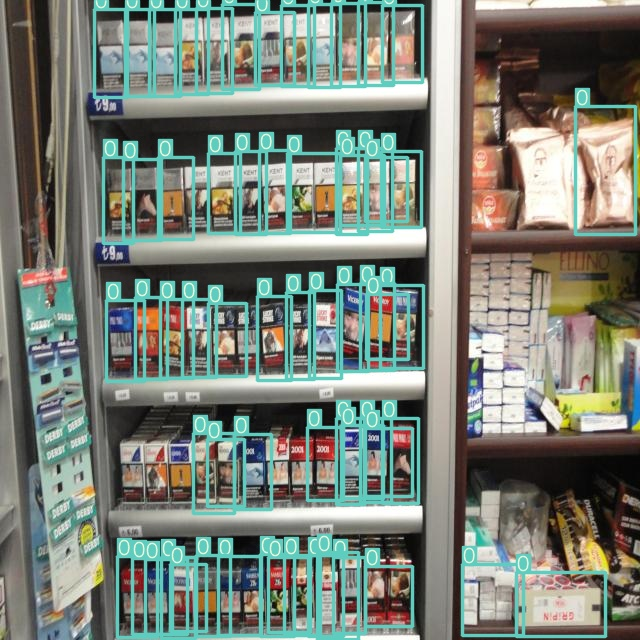

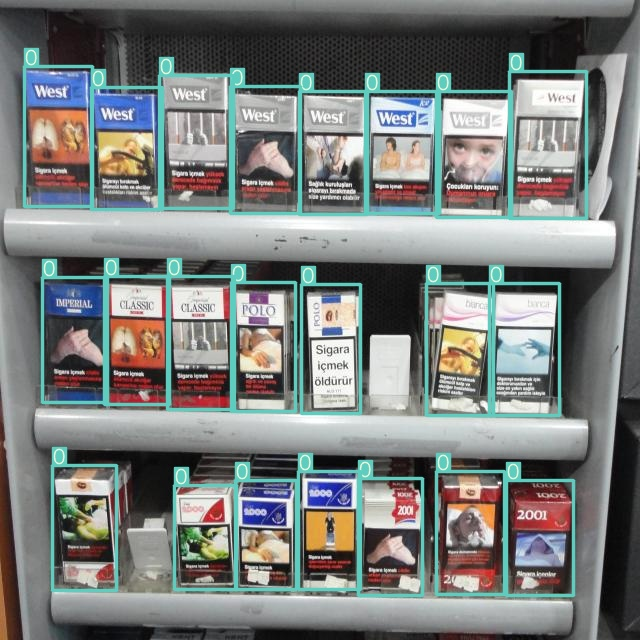

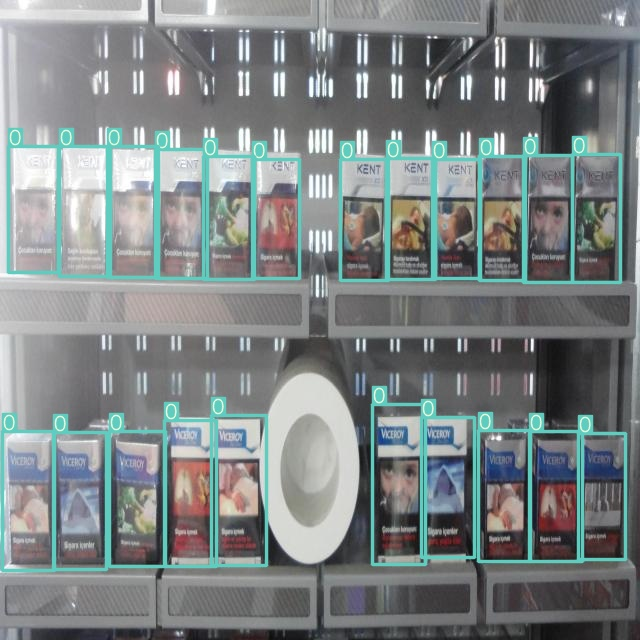

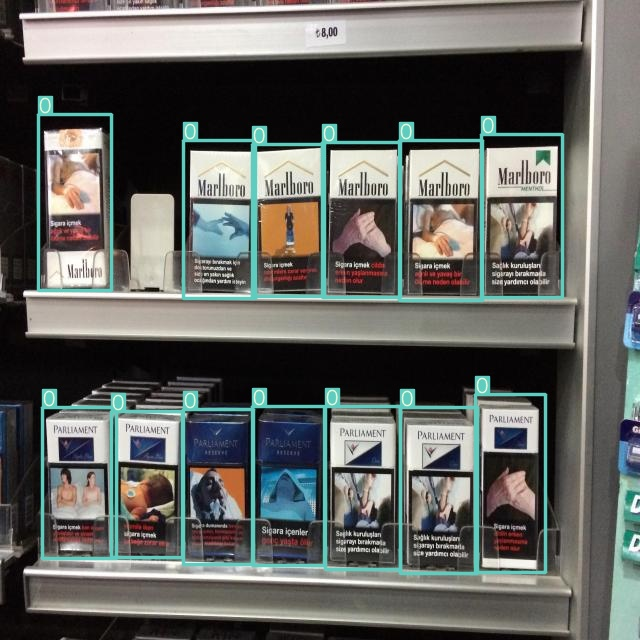

In [44]:
#display inference on ALL test images
#this looks much better with longer training above
import glob
from IPython.display import Image, display

%cd /content/drive/MyDrive/yolov4/
for imageName in glob.glob('./inference/output/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [45]:
from google.colab import files
files.download('./runs/exp5_yolov4-5p-results/weights/best_yolov4-5p-results.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>